<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/Bihar_Election_2025_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bihar Election 2025 Dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

# About this dataset

This comprehensive dataset provides granular results from the Bihar Election 2025, encompassing 2859 entries across 243 constituencies. Each record details a candidate's performance, including their constituency number and name, serial number, candidate name, political party, EVM votes, postal votes, total votes, and vote percentage. The data types are appropriate, with numerical fields like votes and percentages, and object types for names and party affiliations. Importantly, the dataset is clean, showing no missing values or duplicate entries, which ensures its integrity for further analysis.

Key insights from the exploratory data analysis reveal several interesting patterns. For instance, 'NOTA' (None of the Above) consistently appears as a significant 'candidate' across constituencies, and 'Independent' candidates form the largest category among parties, highlighting the diverse political landscape beyond established party lines. The numerical features exhibit a wide range; for example, total votes vary significantly from a minimum of 90 to a maximum of 140,608, with an average of approximately 17,561 votes per candidate. The vote percentage also shows a broad distribution, from 0.05% to a high of 62.66%, indicating varying levels of candidate support.

The correlation analysis further highlights strong relationships between vote counts: EVM Votes, Postal Votes, and Total Votes are, as expected, highly correlated with each other and with Vote Percentage, reaffirming their direct impact on a candidate's electoral outcome. While most numerical features show positive correlations, the distribution of votes across different parties and constituencies underscores the competitive nature of the election and the varied preferences of the electorate. The presence of 'PIPRA' as the most frequent constituency name, with up to 26 candidates, suggests some constituencies are highly contested or have a larger number of candidates vying for the seat.

In [16]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d etqadahmadkhan/bihar-polls-2025

# Unziping the downloaded file
!unzip bihar-polls-2025.zip

Saving kaggle.json to kaggle (1).json
Dataset URL: https://www.kaggle.com/datasets/etqadahmadkhan/bihar-polls-2025
License(s): unknown
bihar-polls-2025.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  bihar-polls-2025.zip
replace bihar_election_results.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: bihar_election_results.csv  


In [3]:
df = pd.read_csv('bihar_election_results.csv')
df.head(11)

,Constituency Number,Constituency Name,Serial Number,Candidate Name,Party,EVM Votes,Postal Votes,Total Votes,Vote Percentage
0,1,VALMIKI NAGAR,1,DHIRENDRA PRATAP SINGH ALIAS RINKU SINGH,Janata Dal (United),105771,284,106055,45.39
1,1,VALMIKI NAGAR,2,RAMESHWAR YADAV,Bahujan Samaj Party,5294,18,5312,2.27
2,1,VALMIKI NAGAR,3,SURENDRA PRASAD,Indian National Congress,107374,356,107730,46.11
3,1,VALMIKI NAGAR,4,RAJESH SHARMA,Lok Samaj Party,2301,2,2303,0.99
4,1,VALMIKI NAGAR,5,AZHARUDDIN ANSARI,Independent,1553,1,1554,0.67
5,1,VALMIKI NAGAR,6,MAHMAD JALIL,Independent,2426,0,2426,1.04
6,1,VALMIKI NAGAR,7,SURENDRA RAM,Independent,1850,2,1852,0.79
7,1,VALMIKI NAGAR,8,NOTA,None of the Above,6391,9,6400,2.74
8,2,RAMNAGAR,1,AADITYA KUMAR,Bahujan Samaj Party,2649,14,2663,1.25
9,2,RAMNAGAR,2,NAND KISHOR RAM,Bharatiya Janata Party,114958,256,115214,54.13


In [4]:
df.tail(11)

,Constituency Number,Constituency Name,Serial Number,Candidate Name,Party,EVM Votes,Postal Votes,Total Votes,Vote Percentage
2848,243,CHAKAI,1,ALLAUDIN ANSARI,Rashtriya Lok Janshakti Party,3665,2,3667,1.57
2849,243,CHAKAI,2,SAVITRI DEVI,Rashtriya Janata Dal,80275,82,80357,34.51
2850,243,CHAKAI,3,SUMIT KUMAR SINGH,Janata Dal (United),67310,75,67385,28.94
2851,243,CHAKAI,4,NARESH KUMAR SHARMA,Jagrook Janta Party,1265,0,1265,0.54
2852,243,CHAKAI,5,RAHUL KUMAR,Jan Suraaj Party,1894,4,1898,0.82
2853,243,CHAKAI,6,ALIJAVETH SOREN,Independent,6815,13,6828,2.93
2854,243,CHAKAI,7,CHANDAN KUMAR SINGH,Independent,12484,18,12502,5.37
2855,243,CHAKAI,8,RANJIT KUMAR VERMA,Independent,2394,0,2394,1.03
2856,243,CHAKAI,9,SANJAY PRASAD,Independent,48026,39,48065,20.64
2857,243,CHAKAI,10,SOSANA MURMU,Independent,3980,0,3980,1.71


In [5]:
df.shape

(2859, 9)

In [6]:
df.columns

Index(['Constituency Number', 'Constituency Name', 'Serial Number',
       'Candidate Name', 'Party', 'EVM Votes', 'Postal Votes', 'Total Votes',
       'Vote Percentage'],
      dtype='object')

In [7]:
df.dtypes

,0
Constituency Number,int64
Constituency Name,object
Serial Number,int64
Candidate Name,object
Party,object
EVM Votes,int64
Postal Votes,int64
Total Votes,int64
Vote Percentage,float64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2859 entries, 0 to 2858
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Constituency Number  2859 non-null   int64  
 1   Constituency Name    2859 non-null   object 
 2   Serial Number        2859 non-null   int64  
 3   Candidate Name       2859 non-null   object 
 4   Party                2859 non-null   object 
 5   EVM Votes            2859 non-null   int64  
 6   Postal Votes         2859 non-null   int64  
 7   Total Votes          2859 non-null   int64  
 8   Vote Percentage      2859 non-null   float64
dtypes: float64(1), int64(5), object(3)
memory usage: 201.2+ KB


In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Constituency Number,2859.0,NaN,NaN,NaN,127.16929,69.288547,1.0,68.0,128.0,189.0,243.0
Constituency Name,2859,241,PIPRA,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Serial Number,2859.0,NaN,NaN,NaN,6.804127,4.101422,1.0,3.0,6.0,10.0,23.0
Candidate Name,2859,2268,NOTA,243,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Party,2859,163,Independent,925,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EVM Votes,2859.0,NaN,NaN,NaN,17499.197971,32948.479007,90.0,967.5,2270.0,6165.5,140370.0
Postal Votes,2859.0,NaN,NaN,NaN,62.093739,128.585714,0.0,1.0,4.0,37.0,855.0
Total Votes,2859.0,NaN,NaN,NaN,17561.29171,33058.819081,90.0,968.5,2276.0,6187.5,140608.0
Vote Percentage,2859.0,NaN,NaN,NaN,8.499465,15.864663,0.05,0.47,1.11,3.015,62.66


In [10]:
df.isnull().sum()

,0
Constituency Number,0
Constituency Name,0
Serial Number,0
Candidate Name,0
Party,0
EVM Votes,0
Postal Votes,0
Total Votes,0
Vote Percentage,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

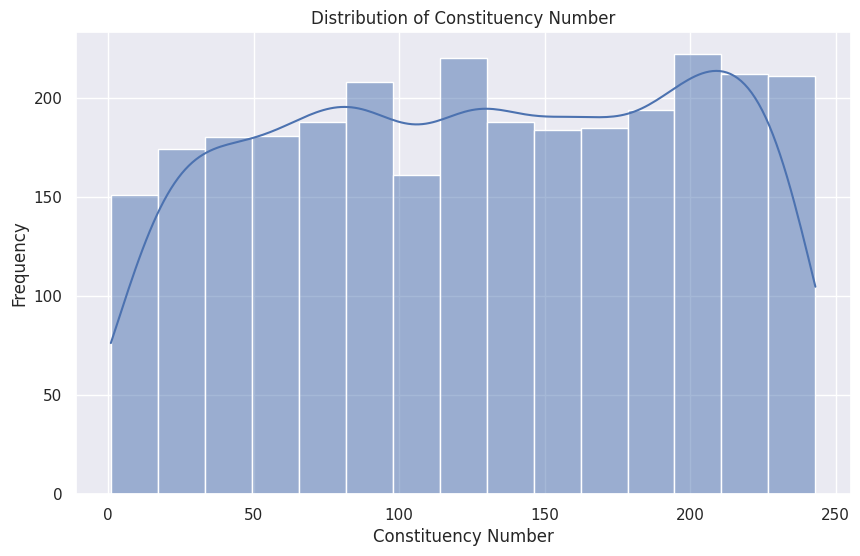

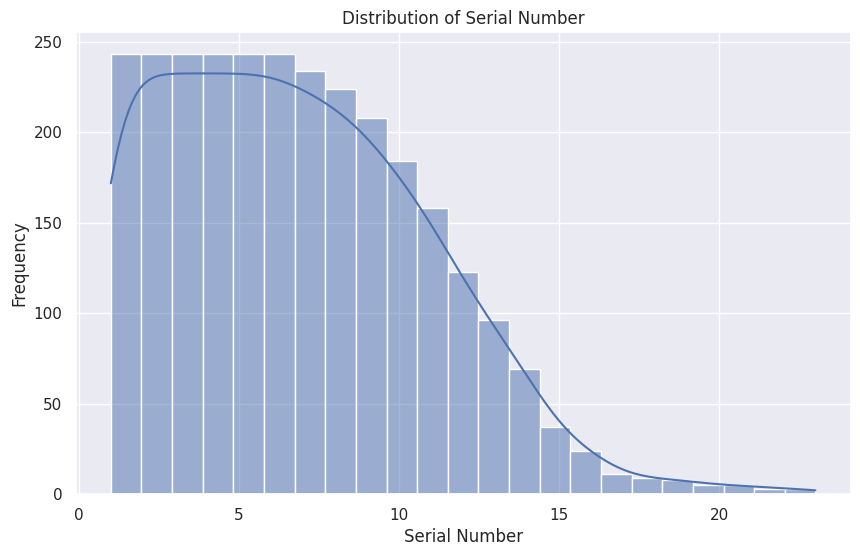

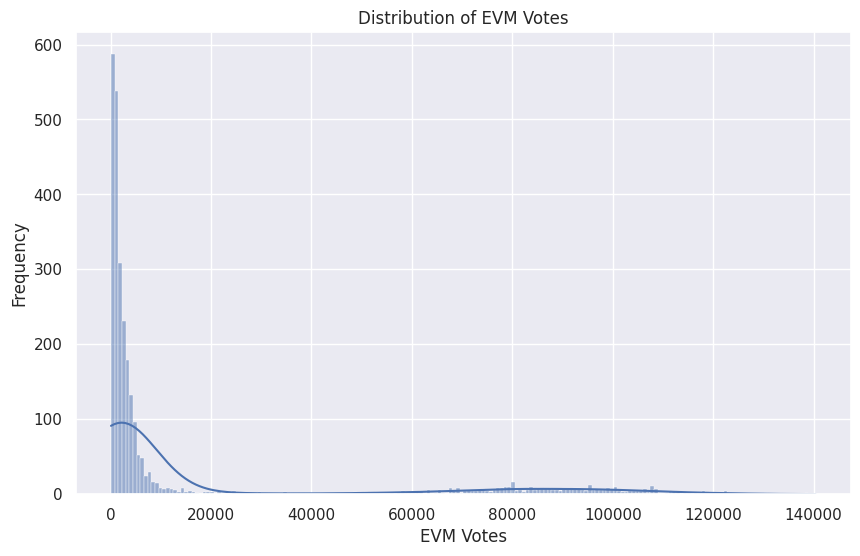

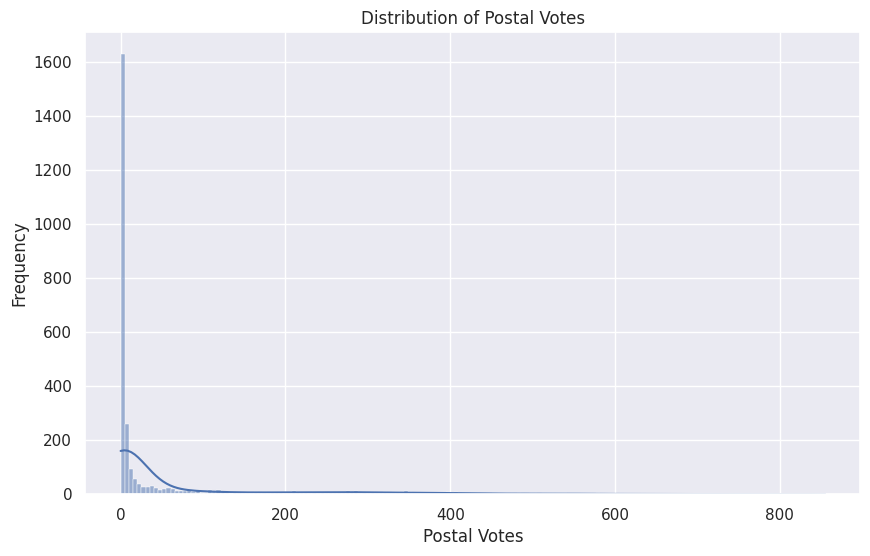

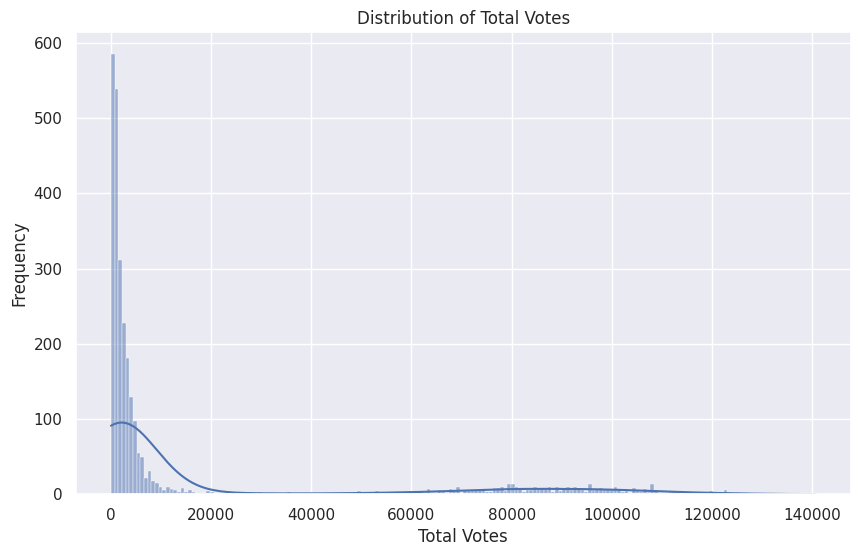

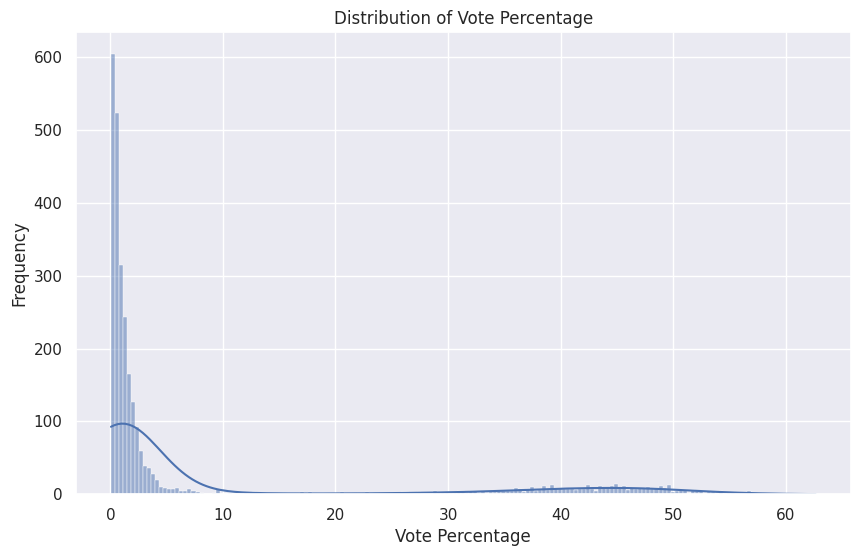

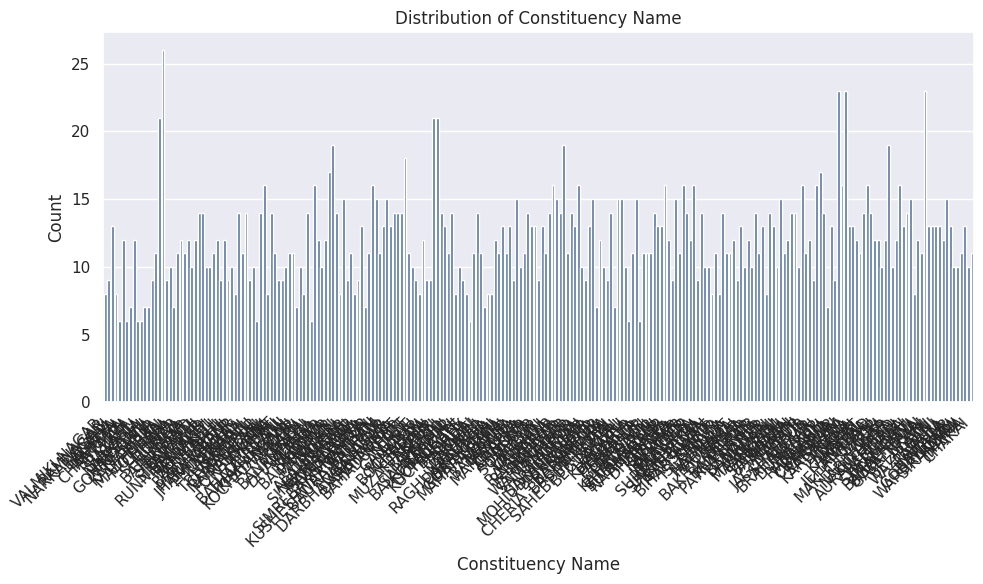

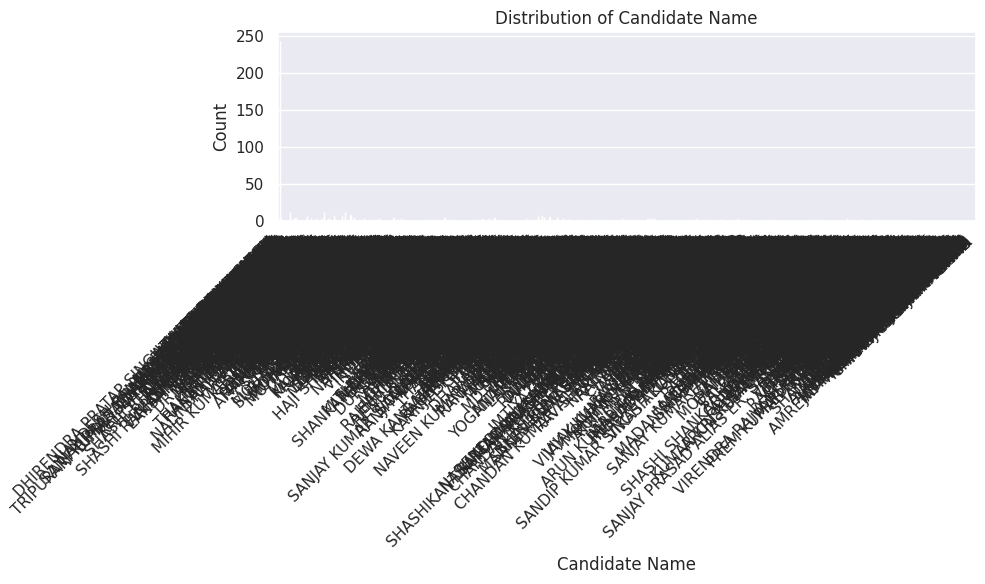

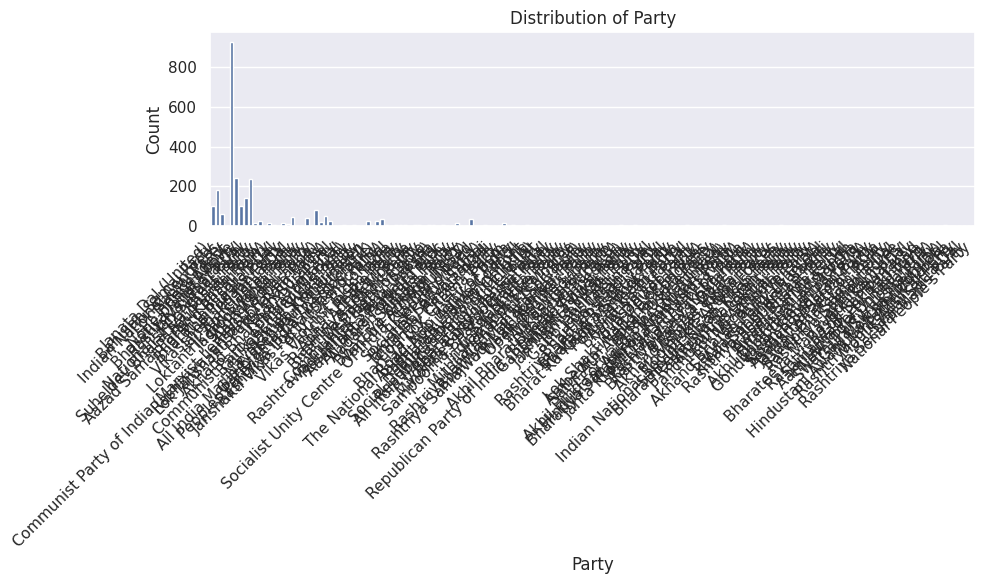

Value counts for Constituency Name:
Constituency Name
PIPRA        26
GAYA TOWN    23
CHAINPUR     23
SASARAM      23
KALYANPUR    21
             ..
CHANPATIA     6
SUGAULI       6
RAXAUL        6
ALAULI        6
PARBATTA      6
Name: count, Length: 241, dtype: int64

Value counts for Candidate Name:
Candidate Name
NOTA                 243
SANJAY KUMAR          12
RAKESH KUMAR          12
SUNIL KUMAR           12
RAHUL KUMAR            9
                    ... 
SHREYASI SINGH         1
RAMASHISH YADAV        1
ANGAD RAM              1
VASHISHTHA PASWAN      1
LALAN PASWAN           1
Name: count, Length: 2268, dtype: int64

Value counts for Party:
Party
Independent                       925
None of the Above                 243
Jan Suraaj Party                  238
Bahujan Samaj Party               181
Rashtriya Janata Dal              143
                                 ... 
Gana Suraksha Party                 1
Rashtriya Jantantrik Morcha         1
Moulik Adhikar Party            

In [12]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

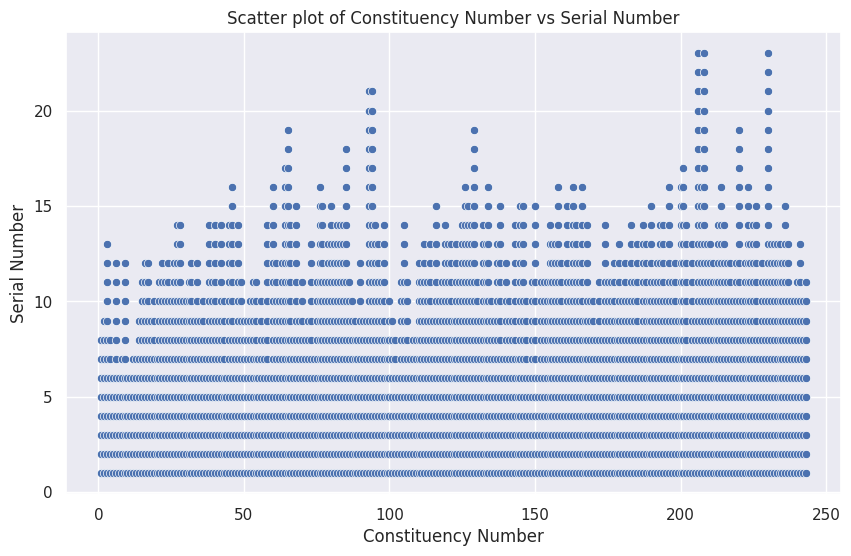

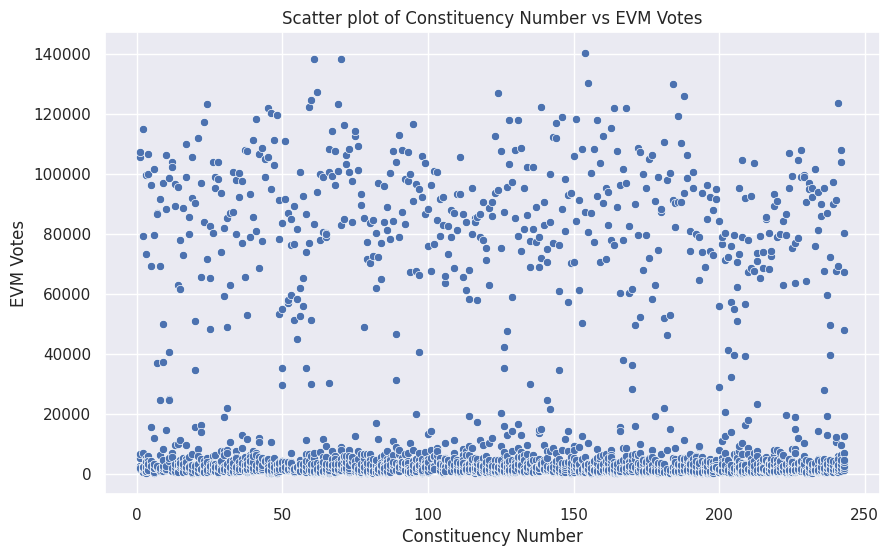

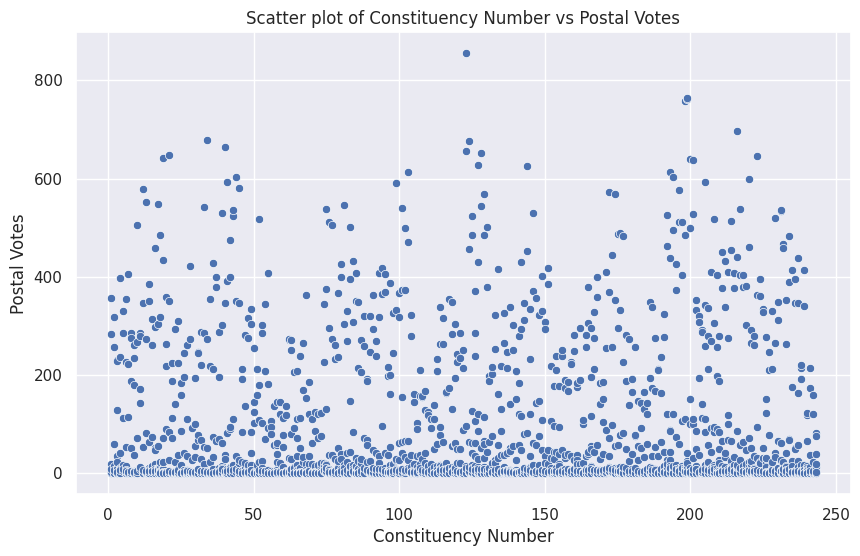

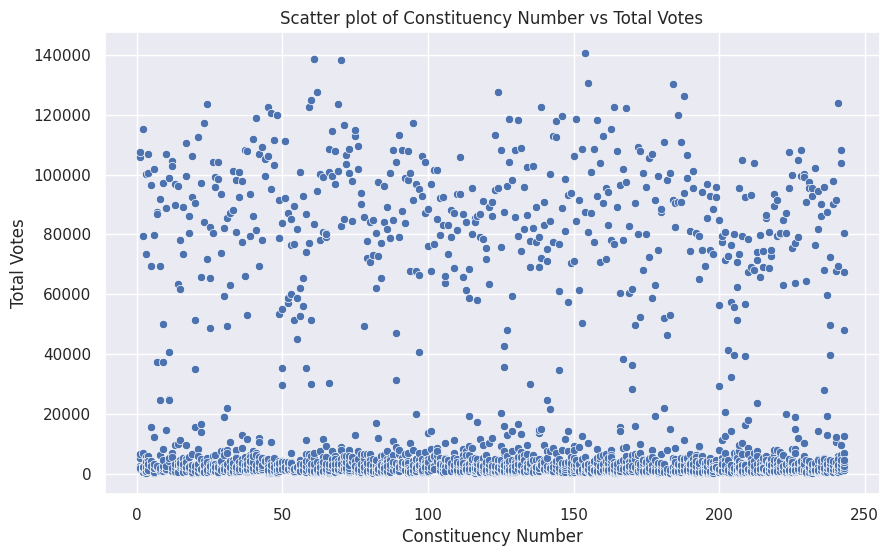

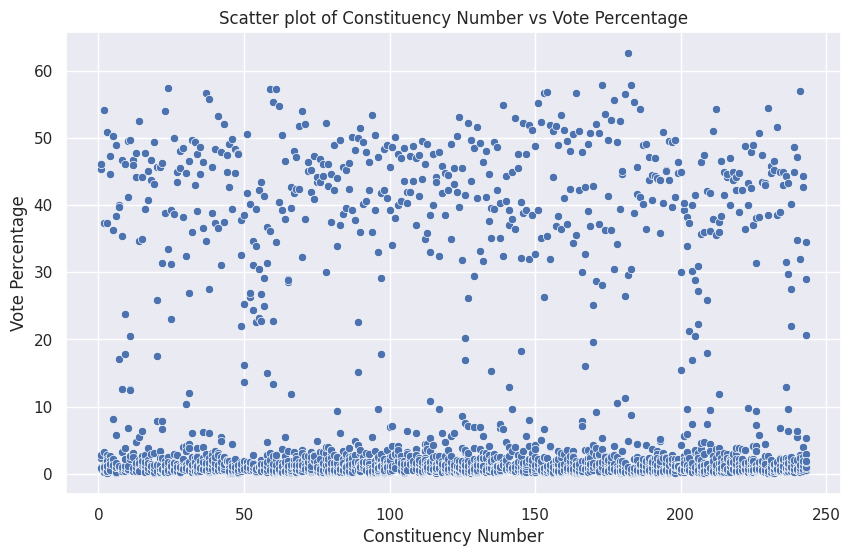

...

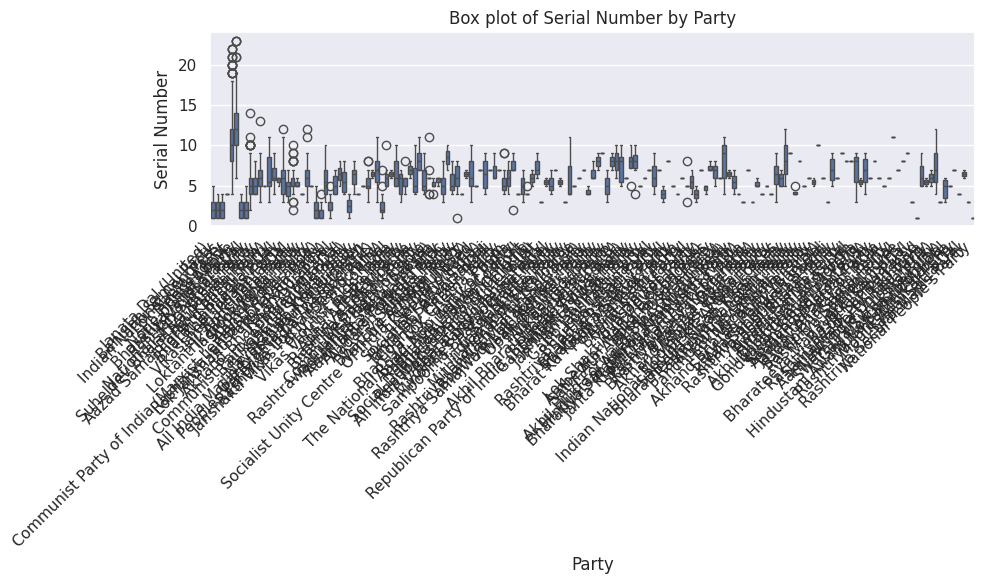

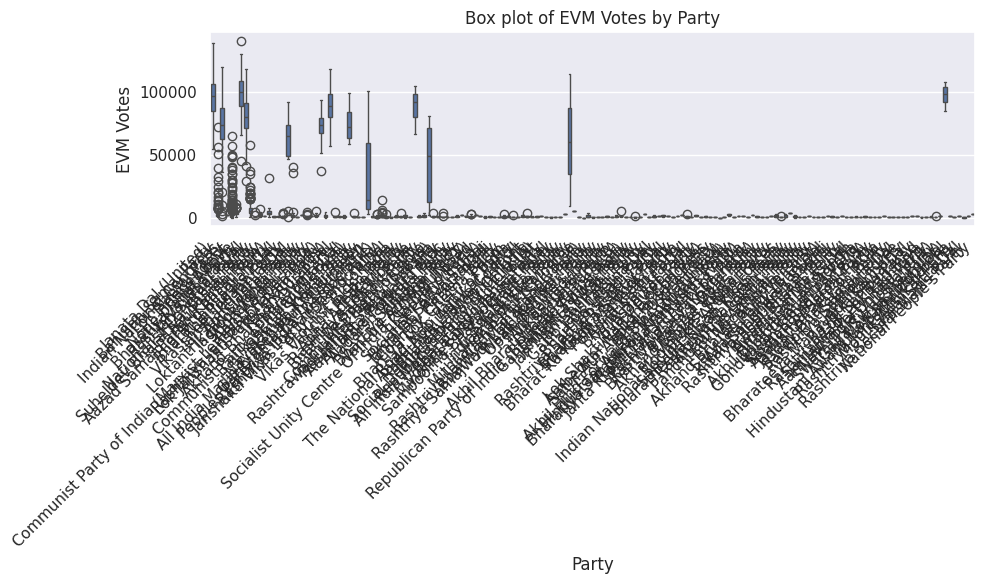

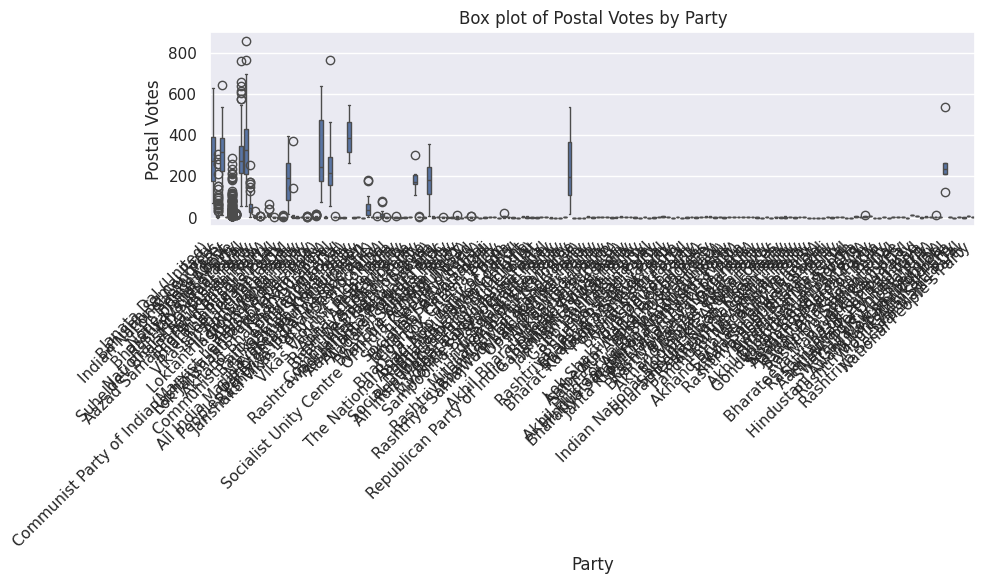

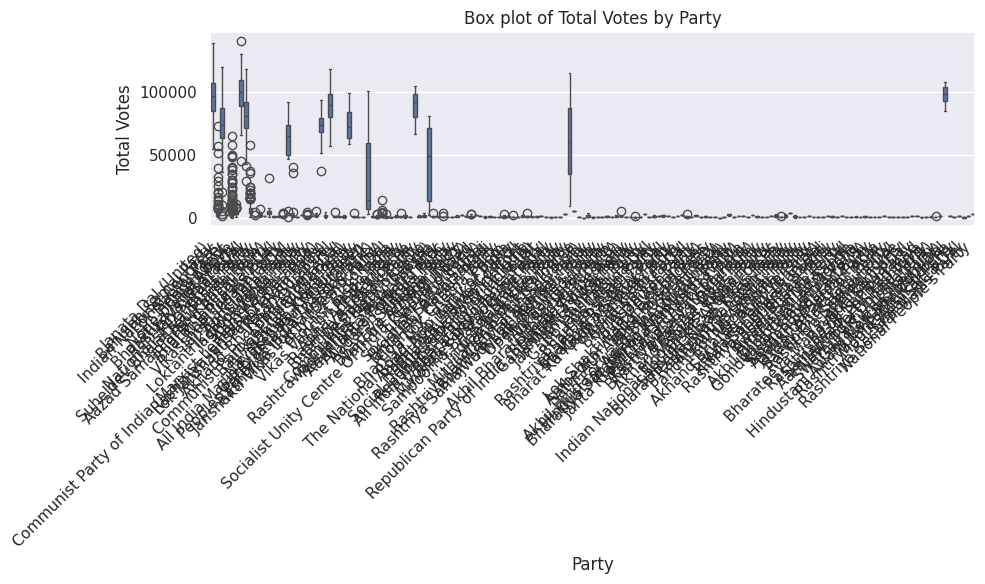

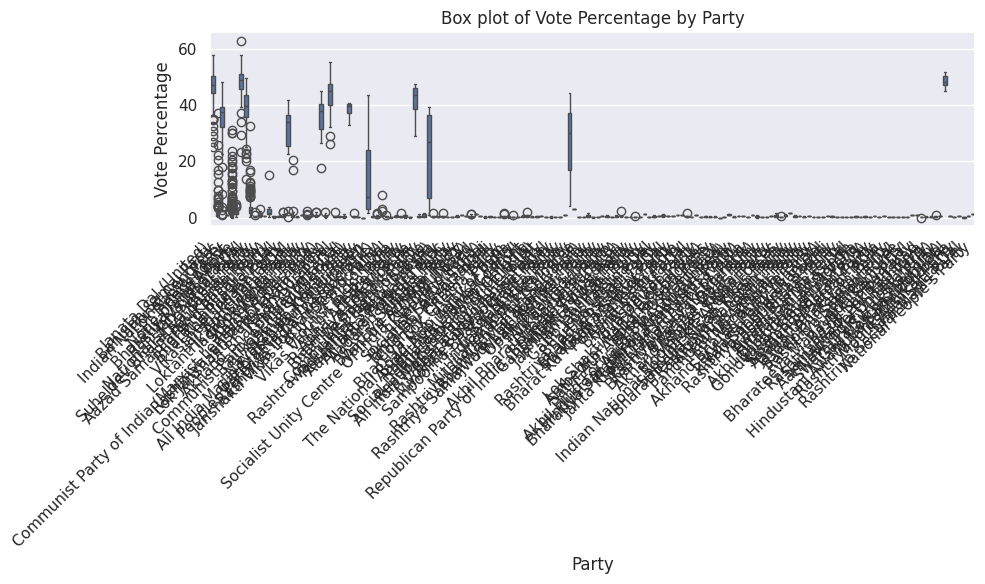

In [13]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

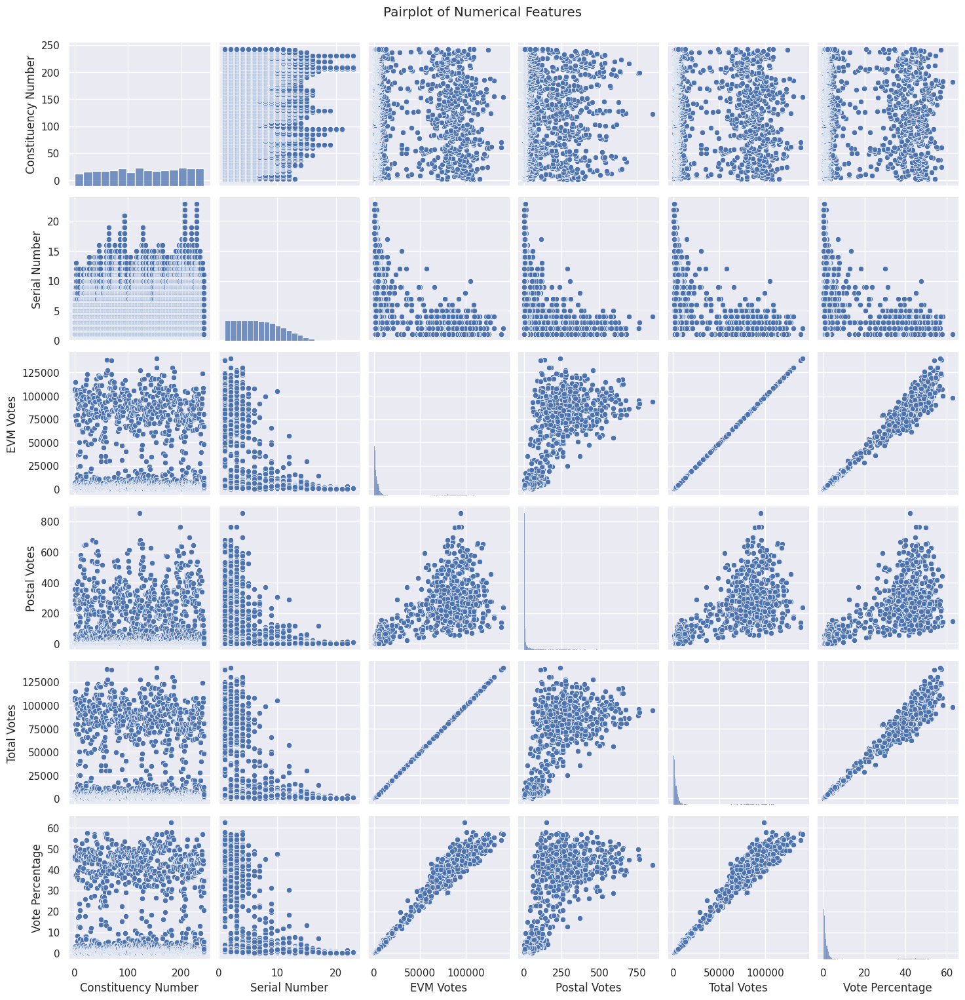

In [14]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

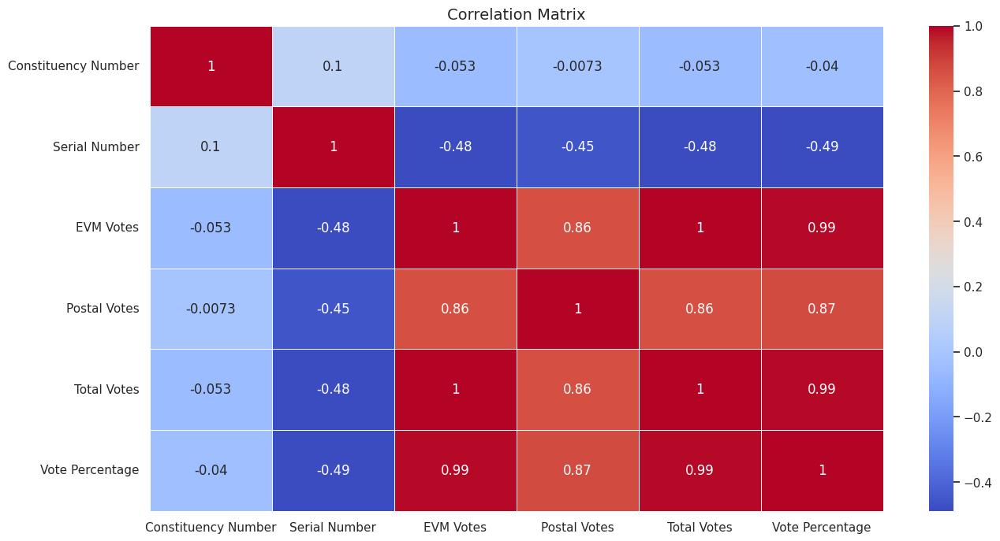

In [15]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You